In [1]:
import sys 
sys.path.append("../")
from QAOAUtils import * 

In [2]:
n = 8
A= rand_adj(n)

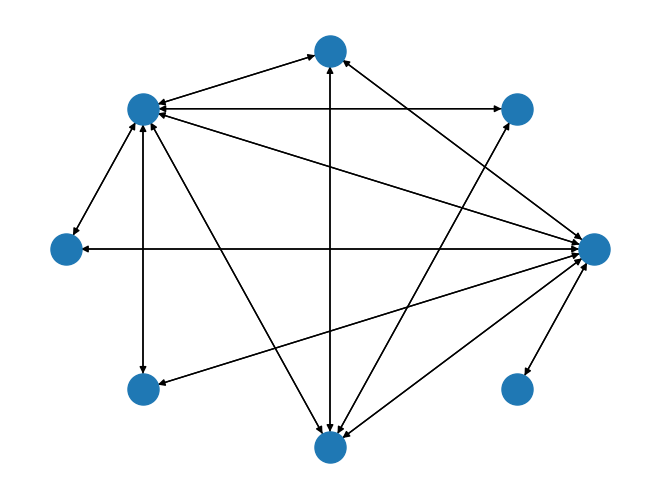

In [3]:
import networkx as nx
G = nx.DiGraph(A)
nx.draw(G, nx.circular_layout(G), node_size=500)


### Single Layer Behavior

In [4]:
Y = GW(A)  ###calculate the full GW embedding
_,GW2_angles,_ = GW2(A,GW_Y=Y,reps=10000) ###project to 2d angles using precalculated GW embedding 
_,GW3_angles,_ = GW3(A,GW_Y=Y,reps=10000) ###project to 2d angles using precalculated GW embedding 

In [5]:
###Get circuit information for each warmstart. Circuit information consists of the initial state + the mixer operators for each qubit
GW2_circ_data = Q2_data(GW2_angles,rotation = 0)
GW3_circ_data = Q3_data(GW3_angles,rotation = 0)

precomp  = pre_compute(A) ###compute the Hamiltonian information for the cost layers (shared for all circuits)

In [6]:
default_data = sample_landscape(precomp,[],mixer_ops=None,init=None,d=100)

In [7]:
GW2_data = sample_landscape(precomp,[],mixer_ops=GW2_circ_data[1],init=GW2_circ_data[0],d=100)

In [8]:
GW3_data = sample_landscape(precomp,[],mixer_ops=GW3_circ_data[1],init=GW3_circ_data[0],d=100)

In [9]:
[np.max(x) for x in [default_data, GW2_data, GW3_data]]

[np.float64(1.5608079581794254),
 np.float64(3.335406875291881),
 np.float64(3.3367689642346945)]

### Plot of loss and gradient landscapes

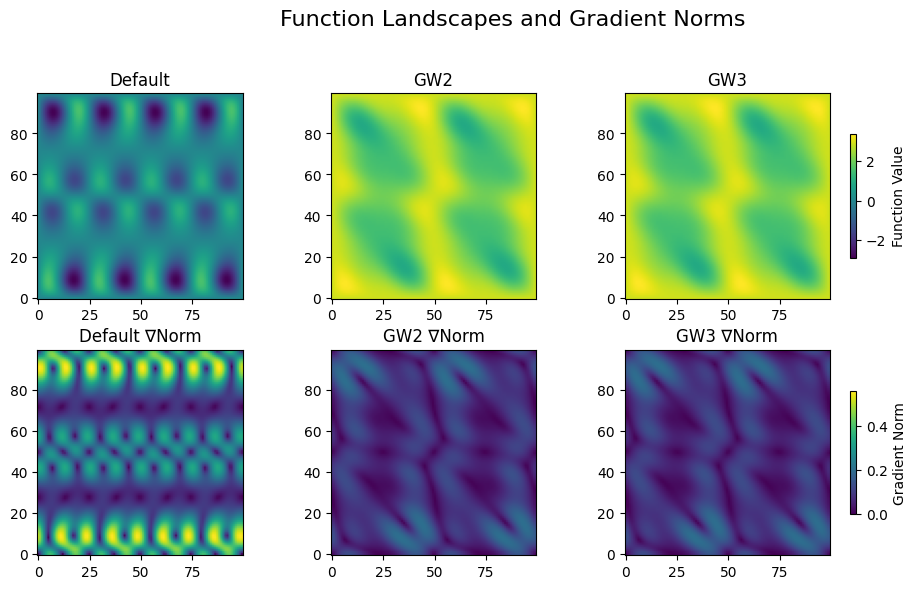

In [10]:
default_grad_norm = np.sqrt(np.gradient(default_data)[0]**2 + np.gradient(default_data)[1]**2)
GW2_grad_norm = np.sqrt(np.gradient(GW2_data)[0]**2 + np.gradient(GW2_data)[1]**2)
GW3_grad_norm = np.sqrt(np.gradient(GW3_data)[0]**2 + np.gradient(GW3_data)[1]**2)

# Get vmin/vmax for consistent color scales
vmin = np.min([default_data, GW2_data, GW3_data])
vmax = np.max([default_data, GW2_data, GW3_data])
vmin_grad = np.min([default_grad_norm, GW2_grad_norm, GW3_grad_norm])
vmax_grad = np.max([default_grad_norm, GW2_grad_norm, GW3_grad_norm])

# Create subplots with constrained layout and reduced spacing
fig, axes = plt.subplots(2, 3, figsize=(14, 6), constrained_layout=False)
fig.subplots_adjust(wspace=0.15, hspace=0.25, right=0.85)  # Space between plots and reserve room for colorbars

# First row: function landscapes
im0 = axes[0, 0].imshow(default_data.T, vmin=vmin, vmax=vmax,origin='lower')
axes[0, 0].set_title("Default")

im1 = axes[0, 1].imshow(GW2_data.T, vmin=vmin, vmax=vmax,origin='lower')
axes[0, 1].set_title("GW2")

im2 = axes[0, 2].imshow(GW3_data.T, vmin=vmin, vmax=vmax,origin='lower')
axes[0, 2].set_title("GW3")

# Second row: gradient norms
im3 = axes[1, 0].imshow(default_grad_norm.T, vmin=vmin_grad, vmax=vmax_grad, cmap='viridis',origin='lower')
axes[1, 0].set_title("Default ∇Norm")

im4 = axes[1, 1].imshow(GW2_grad_norm.T, vmin=vmin_grad, vmax=vmax_grad, cmap='viridis',origin='lower')
axes[1, 1].set_title("GW2 ∇Norm")

im5 = axes[1, 2].imshow(GW3_grad_norm.T, vmin=vmin_grad, vmax=vmax_grad, cmap='viridis',origin='lower')
axes[1, 2].set_title("GW3 ∇Norm")

# Add vertical colorbars on the right side
cbar1 = fig.colorbar(im0, ax=axes[0, :], location='right', shrink=0.6, pad=0.02)
cbar1.set_label('Function Value')

cbar2 = fig.colorbar(im3, ax=axes[1, :], location='right', shrink=0.6, pad=0.02)
cbar2.set_label('Gradient Norm')

# Suptitle and layout finalization
plt.suptitle("Function Landscapes and Gradient Norms", fontsize=16, y=1.02)
plt.show()

In [11]:
default_data_hist, default_cost_hist = grad_swarm(100, precomp, [], mixer_ops=None, init=None,timesteps = 1000,alpha = 1e-3)
GW2_data_hist, GW2_cost_hist = grad_swarm(100, precomp, [], mixer_ops=GW2_circ_data[1], init=GW2_circ_data[0],timesteps = 1000,alpha = 1e-3)

Evolution of randomly selected parameters in $[\pi/2,3\pi/2]^2$ with no warmstart

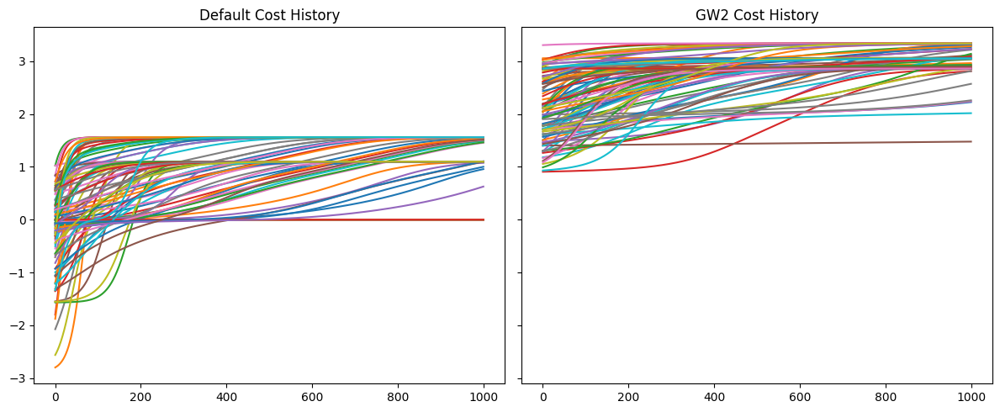

In [12]:

# Create a figure and two subplots (1 row, 2 columns)
fig, axs = plt.subplots(1, 2, figsize=(12, 5),sharey=True)  # Adjust figsize as needed

# First subplot: default_cost_hist
axs[0].plot(np.array(default_cost_hist).T)
axs[0].set_title('Default Cost History')

# Second subplot: GW2_cost_hist
axs[1].plot(np.array(GW2_cost_hist).T)
axs[1].set_title('GW2 Cost History')

# Display the plots
plt.tight_layout()
plt.show()

In [13]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, axs = plt.subplots(1, 2, figsize=(12, 5),sharey=True)  # Adjust figsize as needed

def animate(t):
    
    axs[0].cla()
    axs[1].cla()
    
    axs[0].scatter([d[10 * t ][0] for d in  default_data_hist],[d[10 * t ][1] for d  in default_data_hist],color='red')
    axs[0].imshow(default_data.T,origin='lower',extent=[0,2*np.pi,0,2*np.pi], vmin=vmin, vmax=vmax)
    
    axs[1].scatter([d[10 * t ][0] for d in  GW2_data_hist],[d[10 * t ][1] for d  in GW2_data_hist],color='red')
    axs[1].imshow(GW2_data.T,origin='lower',extent=[0,2*np.pi,0,2*np.pi], vmin=vmin, vmax=vmax)
    
    axs[0].set_title("Default")
    axs[1].set_title("GW2")

matplotlib.animation.FuncAnimation(fig, animate, frames=50)

<Figure size 1800x750 with 0 Axes>

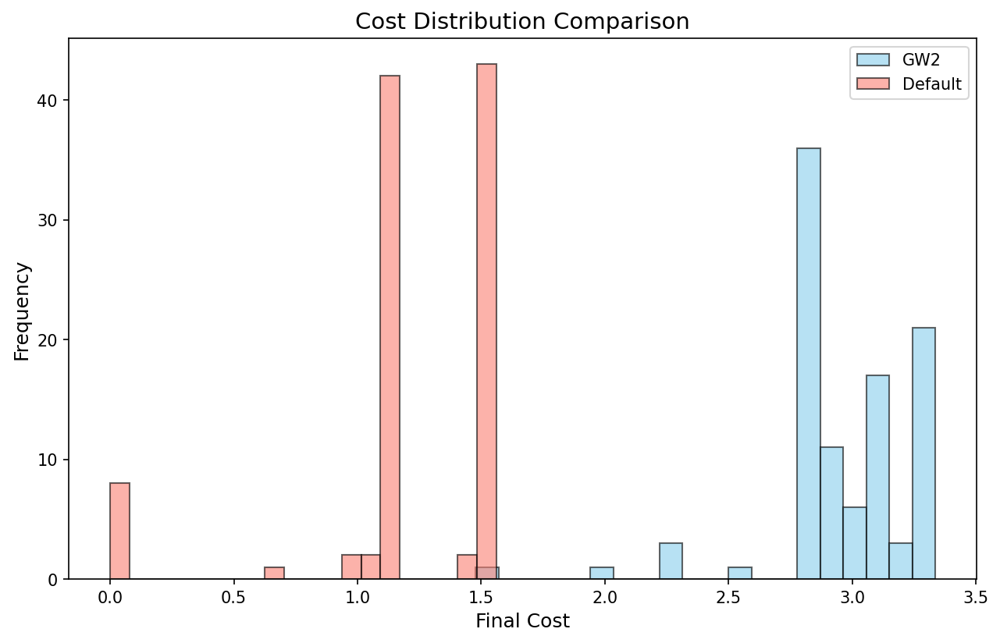

In [14]:
# Clear the current axis
plt.clf()


# Create the histogram
plt.figure(figsize=(10, 6))
plt.hist( [g[-1] for g in GW2_cost_hist], bins=20, alpha=0.6, label='GW2', color='skyblue', edgecolor='black')
plt.hist( [g[-1] for g in default_cost_hist], bins=20, alpha=0.6, label='Default', color='salmon', edgecolor='black')

# Add title and labels
plt.title('Cost Distribution Comparison', fontsize=14)
plt.xlabel('Final Cost', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add legend
plt.legend()
plt.show()

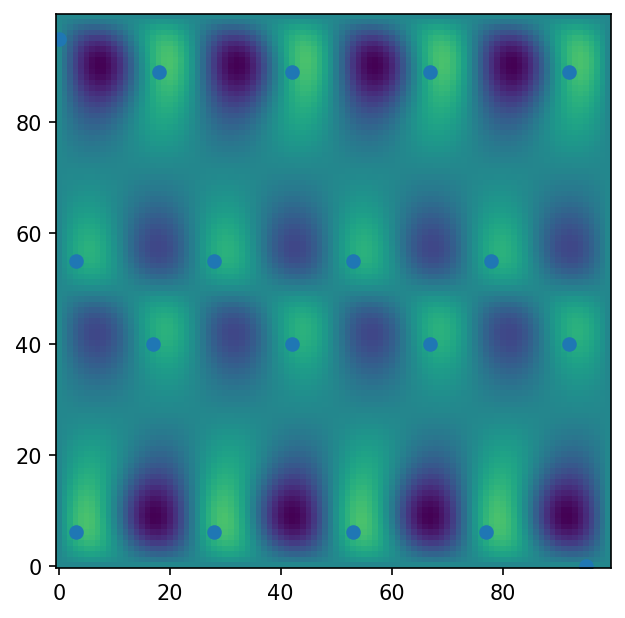

In [15]:
plt.clf()
plt.imshow(default_data.T,origin='lower',vmin=vmin,vmax=vmax)
default_max = find_local_extrema(default_data)[-1]
plt.scatter(*np.array(default_max).T)
plt.show()

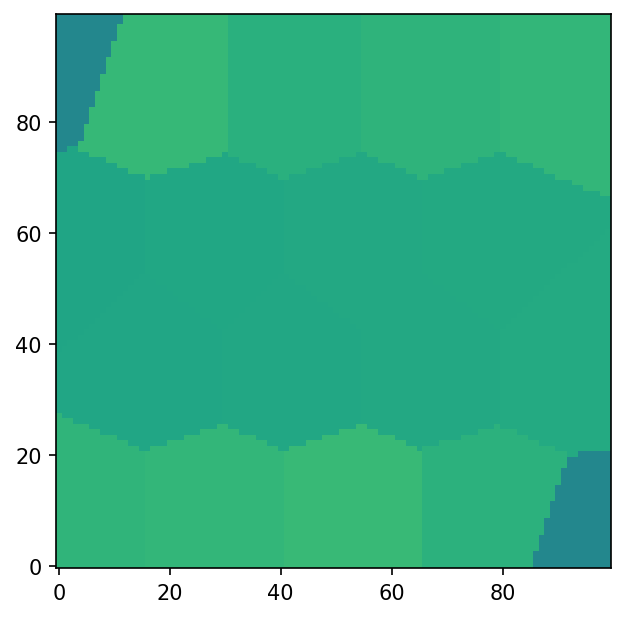

In [16]:
default_A = nearest_max(default_data,default_max,100)
plt.clf()
plt.imshow(default_A.T,origin="lower",vmin=vmin,vmax=vmax)
plt.show()
            

In [17]:
np.mean(default_A)

np.float64(0.9802089137391574)

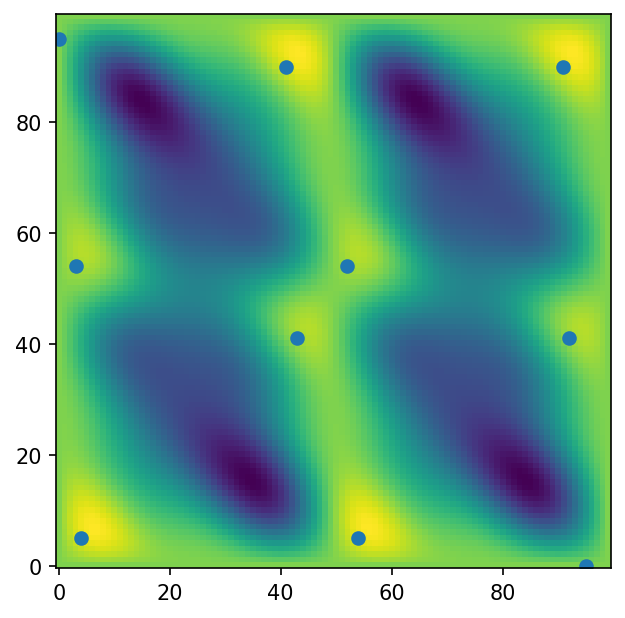

In [18]:
plt.clf()
plt.imshow(GW2_data.T,origin='lower')
GW2_max = find_local_extrema(GW2_data)[-1]
plt.scatter(*np.array(GW2_max).T)
plt.show()

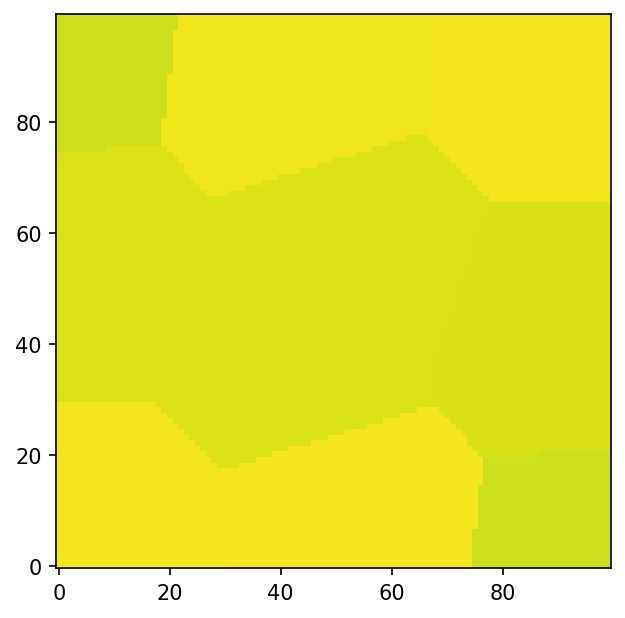

In [19]:
GW2_A = nearest_max(GW2_data,GW2_max,100)
plt.clf()
plt.imshow(GW2_A.T,origin="lower",vmin=vmin,vmax=vmax)
plt.show()

In [20]:
np.mean(GW2_A)

np.float64(3.0759400890882267)

### One fixed optimized layer

In [21]:
default_opt_params = np.linspace(0,2*np.pi,100)[[np.unravel_index(np.argmax(default_data),default_data.shape)]][0]
GW2_opt_params = np.linspace(0,2*np.pi,100)[[np.unravel_index(np.argmax(GW2_data),GW2_data.shape)]][0]

In [22]:
default_data_layer1 = sample_landscape(precomp,default_opt_params,mixer_ops=None,init=None,d=100)
GW2_data_layer1 = sample_landscape(precomp,GW2_opt_params,mixer_ops=GW2_circ_data[1],init=GW2_circ_data[0],d=100)

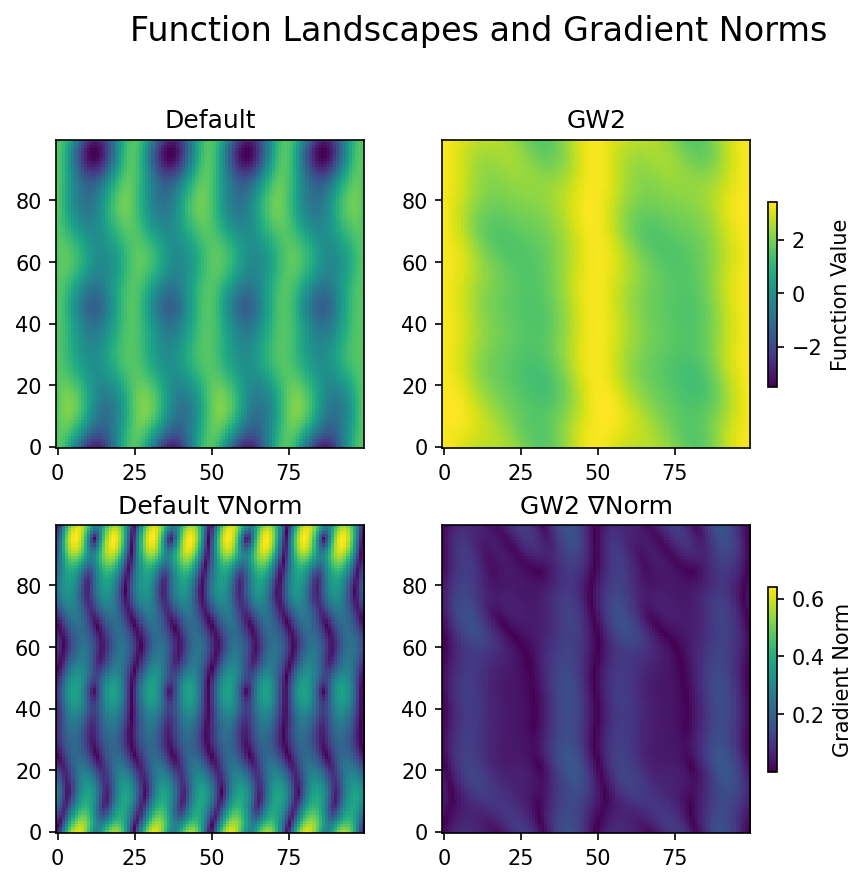

In [23]:
default_grad_norm = np.sqrt(np.gradient(default_data_layer1)[0]**2 + np.gradient(default_data_layer1)[1]**2)
GW2_grad_norm = np.sqrt(np.gradient(GW2_data_layer1)[0]**2 + np.gradient(GW2_data_layer1)[1]**2)

# Get vmin/vmax for consistent color scales
vmin = np.min([default_data_layer1, GW2_data_layer1])
vmax = np.max([default_data_layer1, GW2_data_layer1])
vmin_grad = np.min([default_grad_norm, GW2_grad_norm])
vmax_grad = np.max([default_grad_norm, GW2_grad_norm])

# Create subplots with constrained layout and reduced spacing
fig, axes = plt.subplots(2, 2, figsize=(8, 6), constrained_layout=False)
fig.subplots_adjust(wspace=0.15, hspace=0.25, right=0.85)  # Space between plots and reserve room for colorbars

# First row: function landscapes
im0 = axes[0, 0].imshow(default_data_layer1.T, vmin=vmin, vmax=vmax,origin='lower')
axes[0, 0].set_title("Default")

im1 = axes[0, 1].imshow(GW2_data_layer1.T, vmin=vmin, vmax=vmax,origin='lower')
axes[0, 1].set_title("GW2")


# Second row: gradient norms
im3 = axes[1, 0].imshow(default_grad_norm.T, vmin=vmin_grad, vmax=vmax_grad, cmap='viridis',origin='lower')
axes[1, 0].set_title("Default ∇Norm")

im4 = axes[1, 1].imshow(GW2_grad_norm.T, vmin=vmin_grad, vmax=vmax_grad, cmap='viridis',origin='lower')
axes[1, 1].set_title("GW2 ∇Norm")

# Add vertical colorbars on the right side
cbar1 = fig.colorbar(im0, ax=axes[0, :], location='right', shrink=0.6, pad=0.02)
cbar1.set_label('Function Value')

cbar2 = fig.colorbar(im3, ax=axes[1, :], location='right', shrink=0.6, pad=0.02)
cbar2.set_label('Gradient Norm')

# Suptitle and layout finalization
plt.suptitle("Function Landscapes and Gradient Norms", fontsize=16, y=1.02)
plt.show()

In [24]:
default_data_hist_layer1, default_cost_hist_layer1 = grad_swarm(100, precomp, default_opt_params, mixer_ops=None, init=None,timesteps = 1000,alpha = 1e-3)
GW2_data_hist_layer1, GW2_cost_hist_layer1 = grad_swarm(100, precomp, GW2_opt_params, mixer_ops=GW2_circ_data[1], init=GW2_circ_data[0],timesteps = 1000,alpha = 1e-3)

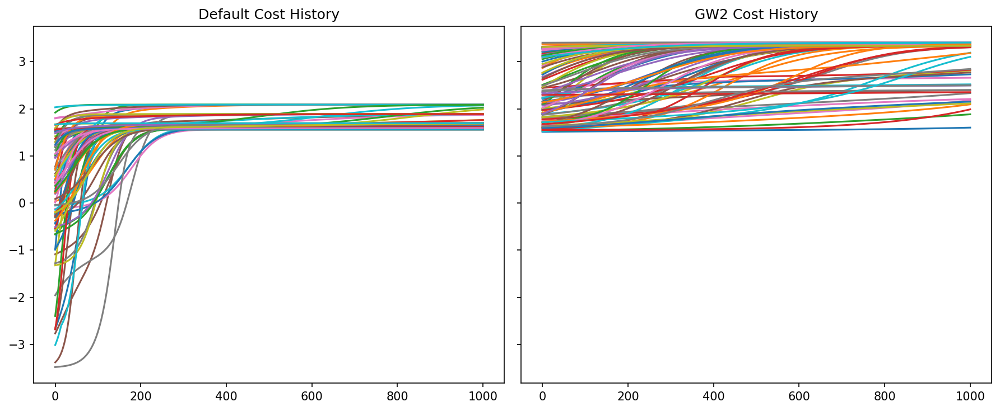

In [25]:

# Create a figure and two subplots (1 row, 2 columns)
fig, axs = plt.subplots(1, 2, figsize=(12, 5),sharey=True)  # Adjust figsize as needed

# First subplot: default_cost_hist
axs[0].plot(np.array(default_cost_hist_layer1).T)
axs[0].set_title('Default Cost History')

# Second subplot: GW2_cost_hist
axs[1].plot(np.array(GW2_cost_hist_layer1).T)
axs[1].set_title('GW2 Cost History')

# Display the plots
plt.tight_layout()
plt.show()

In [26]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, axs = plt.subplots(1, 2, figsize=(12, 5),sharey=True)  # Adjust figsize as needed

def animate(t):
    
    axs[0].cla()
    axs[1].cla()
    
    axs[0].scatter([d[10 * t ][0] for d in  default_data_hist_layer1],[d[10 * t ][1] for d  in default_data_hist_layer1],color='red')
    axs[0].imshow(default_data_layer1.T,origin='lower',extent=[0,2*np.pi,0,2*np.pi], vmin=vmin, vmax=vmax)
    
    axs[1].scatter([d[10 * t ][0] for d in  GW2_data_hist_layer1],[d[10 * t ][1] for d  in GW2_data_hist_layer1],color='red')
    axs[1].imshow(GW2_data_layer1.T,origin='lower',extent=[0,2*np.pi,0,2*np.pi], vmin=vmin, vmax=vmax)
    
    axs[0].set_title("Default")
    axs[1].set_title("GW2")

matplotlib.animation.FuncAnimation(fig, animate, frames=50)

<Figure size 1800x750 with 0 Axes>

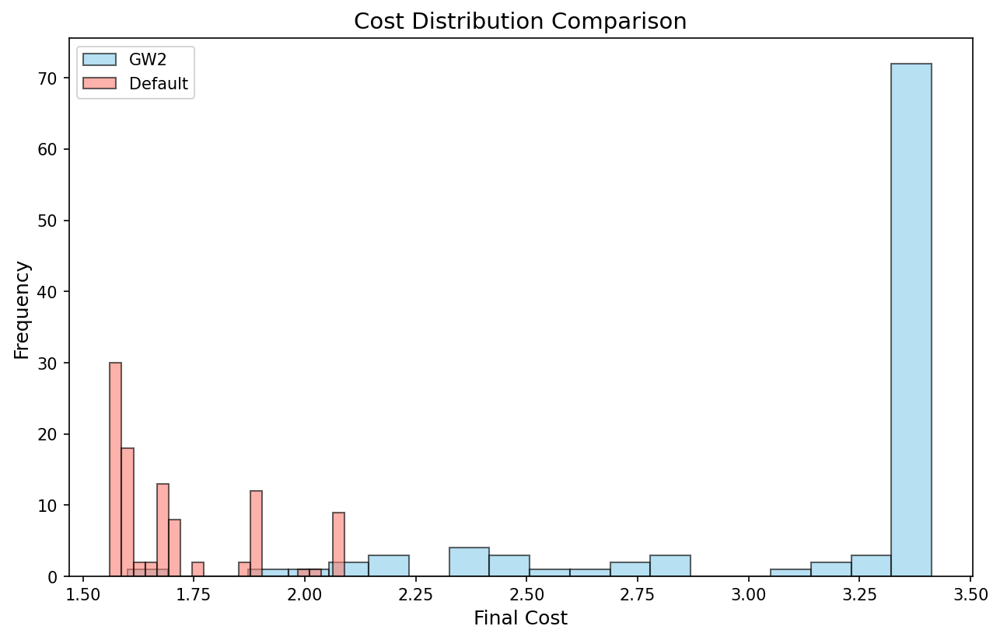

In [27]:
# Clear the current axis
plt.clf()


# Create the histogram
plt.figure(figsize=(10, 6))
plt.hist( [g[-1] for g in GW2_cost_hist_layer1], bins=20, alpha=0.6, label='GW2', color='skyblue', edgecolor='black')
plt.hist( [g[-1] for g in default_cost_hist_layer1], bins=20, alpha=0.6, label='Default', color='salmon', edgecolor='black')

# Add title and labels
plt.title('Cost Distribution Comparison', fontsize=14)
plt.xlabel('Final Cost', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add legend
plt.legend()
plt.show()

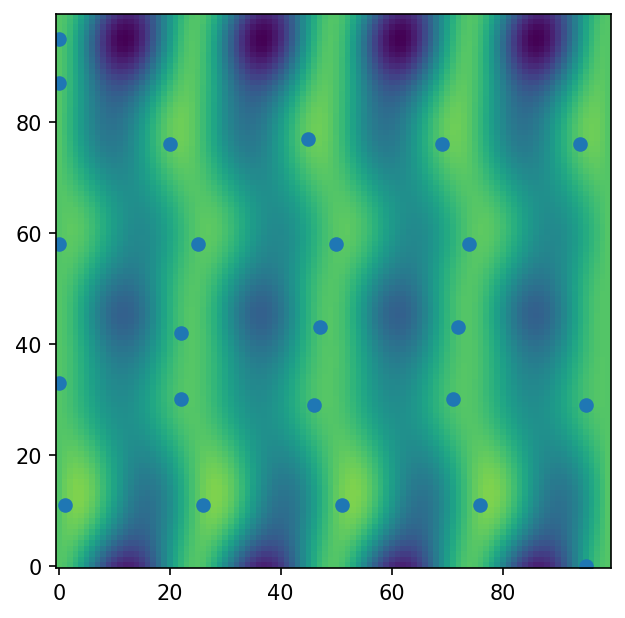

In [28]:
plt.clf()
plt.imshow(default_data_layer1.T,origin='lower',vmin=vmin,vmax=vmax)
default_max_layer1 = find_local_extrema(default_data_layer1)[-1]
plt.scatter(*np.array(default_max_layer1).T)
plt.show()

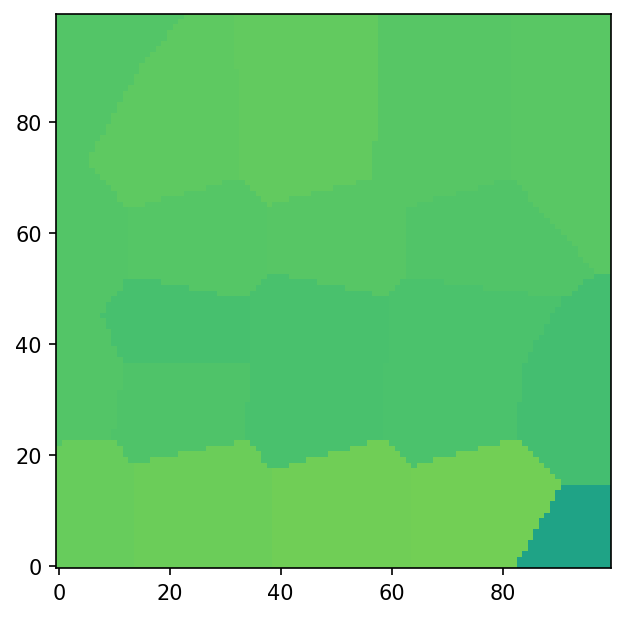

In [29]:
default_A_layer1 = nearest_max(default_data_layer1,default_max_layer1,100)
plt.clf()
plt.imshow(default_A_layer1.T,origin="lower",vmin=vmin,vmax=vmax)
plt.show()
            

In [30]:
np.mean(default_A_layer1)

np.float64(1.600251717062691)

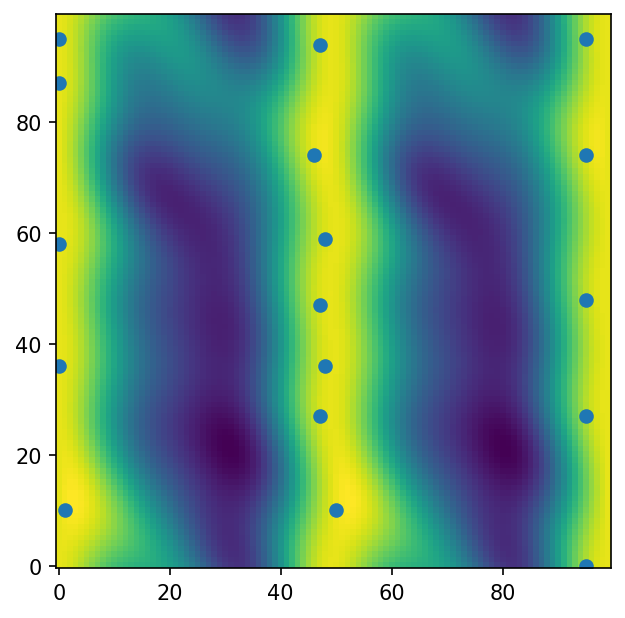

In [31]:
plt.clf()
plt.imshow(GW2_data_layer1.T,origin='lower')
GW2_max_layer1 = find_local_extrema(GW2_data_layer1)[-1]
plt.scatter(*np.array(GW2_max_layer1).T)
plt.show()

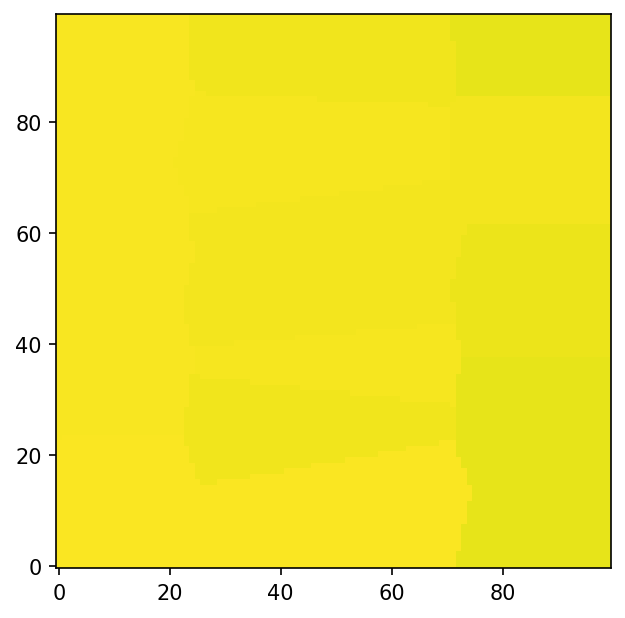

In [32]:
GW2_A_layer1 = nearest_max(GW2_data_layer1,GW2_max_layer1,100)
plt.clf()
plt.imshow(GW2_A_layer1.T,origin="lower",vmin=vmin,vmax=vmax)
plt.show()

In [33]:
np.mean(GW2_A_layer1)

np.float64(3.286714053493566)

In [34]:
np.max(precomp)

np.float64(3.5)